## scVI + scANVI data integration and label transfer for TB PBMC study (Cai 2020, Cai 2022, AIDA reference)

**Objective**: Run scVI + scANVI integration and label transfer model for TB PBMCs [Cai 2020 and Cai 2022] with healthy control [AIDA ref]


- **Developed by**: Mairi McClean

- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**

- v230815

- Following this tutorial:https://docs.scvi-tools.org/en/stable/tutorials/notebooks/harmonization.html



### Import modules and set working environment

In [1]:
import scanpy as sc
import scvi
from rich import print
from scib_metrics.benchmark import Benchmarker

Global seed set to 0
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)


In [2]:
sc.set_figure_params(figsize=(4, 4))
scvi.settings.seed = 30
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

Global seed set to 30


### Read in data
> Cai 2020 + Cai 2022 TB data

- Read in _Cai Y et al 2020_

In [3]:
caiy2020 = sc.read_h5ad('/Volumes/Expansion/data_lake/processed_files/qc_objects/human/cai2020/cai2020_scrna_PBMC_mm_230306_qcd.h5ad')
caiy2020

AnnData object with n_obs × n_vars = 72935 × 36039
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets'
    var: 'gene_id', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'donor_colors', 'status_colors'
    layers: 'counts', 'sqrt_norm'

In [4]:
caiy2020.obs['status'].value_counts()

status
active_TB    32923
Healthy      22036
latent_TB    17976
Name: count, dtype: int64

- Read in _Cai Y et al 2022_

In [5]:
caiy2022 = sc.read_h5ad('/Volumes/Expansion/data_lake/processed_files/qc_objects/human/cai2022/Cai2022_scrna_PBMC_mm_230306_qcd.h5ad')
caiy2022.obs['status'] = 'TPE'
caiy2022

AnnData object with n_obs × n_vars = 23979 × 31155
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'data_type', 'centre', 'version', 'object', 'protocol', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'status'
    var: 'gene_id', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'donor_colors', 'sample_colors'
    layers: 'counts', 'sqrt_norm'

In [6]:
caiy2022.obs['status'].value_counts()

status
TPE    23979
Name: count, dtype: int64

- Concatenate query datasets

In [7]:
adata_tb = caiy2020.concatenate(caiy2022, batch_key = 'dataset', batch_categories = ['cai2020', 'cai2022'], join = 'inner')
adata_tb

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 96914 × 28831
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'object', 'protocol', 'dataset'
    var: 'gene_id', 'mt', 'ribo', 'hb', 'n_cells-cai2020', 'n_cells_by_counts-cai2020', 'mean_counts-cai2020', 'pct_dropout_by_counts-cai2020', 'total_counts-cai2020', 'n_cells-cai2022', 'n_cells_by_counts-cai2022', 'mean_counts-cai2022', 'pct_dropout_by_counts-cai2022', 'total_counts-cai2022'
    layers: 'counts', 'sqrt_norm'

In [8]:
adata_tb.obs['seed_labels'] = 'Unknown'

#### Read in reference data

- AIDA 

In [9]:
AIDA = sc.read_h5ad('/Volumes/Expansion/data_lake/processed_files/qc_objects/human/aida/aida_scrna_PBMC_mm_230802_qcd.h5ad')
AIDA

AnnData object with n_obs × n_vars = 923976 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'author_cell_type', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'percent_chrY', 'percent_chrX'
    var: 'feature_is_fi

In [13]:
AIDA.obs['mapped_reference_annotation'].value_counts()

mapped_reference_annotation
GENCODE 32    923976
Name: count, dtype: int64

In [14]:
AIDA.obs['seed_labels'] = AIDA.obs['author_cell_type'].copy()
del(AIDA.obs['author_cell_type'])
AIDA

AnnData object with n_obs × n_vars = 923976 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'percent_chrY', 'percent_chrX', 'seed_labels'
    var: 'feature_is_filtere

In [15]:
AIDA.obs['seed_labels'].value_counts()

seed_labels
CD14+_Monocyte     147675
CD4+_T_naive       127983
CD16+_NK           126847
CD4+_T_cm          100208
CD8+_T_naive        62548
CD8+_T_GZMB+        59774
CD16+_Monocyte      37398
CD8+_T_GZMK+        35160
naive_B             25829
CD4+_T_em           22831
gdT                 22457
T                   17355
CD4+_T              17304
MAIT                17284
IGHMlo_memory_B     16326
CD4+_T_cyt          13021
Monocyte            12639
cDC2                11777
Treg                11433
IGHMhi_memory_B     10226
NK                   6175
B                    5074
CD56+_NK             4623
atypical_B           3582
pDC                  2827
CD8+_T               2732
Plasma_B              874
dnT                   539
Platelet              419
cDC1                  350
cDC                   225
ILC                   219
DC                    141
RBC                   121
Name: count, dtype: int64

#### Relabel columns to ease concatenation


In [16]:
AIDA.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 923976 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'percent_chrY', 'percent_chrX', 'seed_la

In [19]:
AIDA.obs['donor_id'].value_counts()

donor_id
KR_SGI_H057    2730
SG_HEL_H053    2705
KR_SGI_H060    2705
KR_SGI_H015    2689
KR_SGI_H008    2671
               ... 
KR_SGI_H159     183
SG_HEL_H001     141
JP_RIK_H007      69
SG_HEL_H253       3
SG_HEL_H245       2
Name: count, Length: 502, dtype: int64

In [17]:
adata_tb.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 96914 × 28831
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'object', 'protocol', 'dataset', 'seed_labels'
    var: 'gene_id', 'mt', 'ribo', 'hb', 'n_cells-cai2020', 'n_cells_by_counts-cai2020', 'mean_counts-cai2020', 'pct_dropout_by_counts-cai2020', 'total_counts-cai2020', 'n_cells-cai2022', 'n_cells_by_counts-cai2022', 'mean_counts-cai2022', 'pct_dropout_by_counts-cai2022', 'total_counts-cai2022'
    layers: 'counts', 'sqrt_norm'>

In [20]:
AIDA.obs.rename(columns={"donor_id": "donor"}, inplace=True)
AIDA.obs.rename(columns={"sex": "gender"}, inplace=True)
AIDA.obs.rename(columns={"development_stage": "age"}, inplace=True)
AIDA.obs.rename(columns={"cell_type": "detailed_annotation"}, inplace=True)
AIDA.obs['tissue'] = 'PBMC'
AIDA.obs['status'] = 'healthy'
AIDA.obs

,mapped_reference_assembly,mapped_reference_annotation,donor_BMI_at_collection,donor,nCount_RNA,nFeature_RNA,Ethnicity_Selfreported,TCR_VDJdb,TCRa_V_gene,TCRa_D_gene,...,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier,percent_chrY,percent_chrX,seed_labels,tissue,status
index,,,,,,,,,,,,,,,,,,,,,
CCGGGATAGTCCTCCT-SG_B1_L1,GRCh38,GENCODE 32,27.1,SG_HEL_H02a,3771.0,1718,Singaporean Chinese,NA,NA,NA,...,1.295225,0.830831,0.046972,False,False,0.363361,3.410689,CD16+_NK,PBMC,healthy
CCGGTAGCACAGACTT-SG_B1_L1,GRCh38,GENCODE 32,27.1,SG_HEL_H02a,2792.0,1535,Singaporean Chinese,NA,NA,NA,...,0.000000,0.000000,0.000000,False,False,0.321766,3.211854,CD16+_NK,PBMC,healthy
CAGCGACTCCACTCCA-SG_B1_L1,GRCh38,GENCODE 32,27.1,SG_HEL_H02a,3117.0,1399,Singaporean Chinese,NA,NA,NA,...,0.000000,0.000000,0.000000,False,False,0.231001,3.261301,CD14+_Monocyte,PBMC,healthy
CACAGTAGTGTCCTCT-SG_B1_L1,GRCh38,GENCODE 32,27.1,SG_HEL_H02a,5113.0,1818,Singaporean Chinese,EBV,TRAV1-2,None,...,0.000000,0.000000,0.000000,False,False,0.342022,3.583035,CD8+_T_GZMK+,PBMC,healthy
ACGAGGACATACTACG-SG_B1_L1,GRCh38,GENCODE 32,27.1,SG_HEL_H02a,4672.0,1852,Singaporean Chinese,HomoSapiens,TRAV13-2,None,...,0.000000,0.000000,0.000000,False,False,0.240179,3.510919,CD8+_T_GZMK+,PBMC,healthy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GATCGATCATCTCGCT-KR_B12_L2,GRCh38,GENCODE 32,NaN,KR_SGI_H165,2913.0,1256,Korean,NA,NA,NA,...,1.489051,0.911902,0.064164,False,False,0.213814,3.739305,CD14+_Monocyte,PBMC,healthy
ACTGAGTGTCTAGTGT-KR_B12_L2,GRCh38,GENCODE 32,NaN,KR_SGI_H165,4657.0,1751,Korean,NA,NA,NA,...,0.000000,0.000000,0.000000,False,False,0.213994,3.212098,CD16+_NK,PBMC,healthy
AGGGATGTCGAGAGCA-KR_B12_L2,GRCh38,GENCODE 32,NaN,KR_SGI_H165,2928.0,1389,Korean,NA,NA,NA,...,0.000000,0.000000,0.000000,False,False,0.082289,3.122315,CD16+_NK,PBMC,healthy


In [21]:
AIDA.obs['status'].value_counts()

status
healthy    923976
Name: count, dtype: int64

### Merge datasets

In [22]:
adata = AIDA.concatenate(adata_tb, batch_key = 'dataset', batch_categories = ['reference', 'query'], join = 'inner')
adata

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


: 

: 

### Format object and check for downstream analysis

- Remove unrequired columns

In [15]:
adata.obs = adata.obs.drop(columns=['age', 'gender', 'data_type', 'centre', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'S_score', 'version', 'batch', 'Ethnicity', 'Group', 'sequencing_library', 'Protein_modality_weight', 
'individual', 'sample', 'COVID_severity', 'Smoker', 'BMI', 'nFeature_ADT', 'nCount_ADT', 'nFeature_RNA', 'nCount_RNA', 'orig.ident', 'G2M_score', 'predicted_doublets', 'total_counts_mt', 'total_counts', 'n_genes_by_counts', 'n_genes'])

In [16]:
adata.obs['study'] = adata.obs['study'].cat.add_categories("Yoshida_2021").fillna("Yoshida_2021")

- Check label harmonisation

In [17]:
adata.obs

,status,annotation_detailed,annotation_detailed_fullNames,donor,sample_id,total_counts_hb,pct_counts_hb,mt_ok,percent_chrX,doublet_scores,seed_labels,tissue,study,object,protocol,dataset
CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1-reference,Healthy,Monocyte CD14,Classical monocyte,AN5,AN5,2.0,0.036410,True,4.860732,0.026901,Monocyte,PBMC,Yoshida_2021,NaN,NaN,reference
CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1-reference,Healthy,T CD4 helper,T CD4 helper,AN5,AN5,0.0,0.000000,True,6.285949,0.054907,T CD4+,PBMC,Yoshida_2021,NaN,NaN,reference
CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1-reference,Healthy,T CD4 helper,T CD4 helper,AN3,AN3,0.0,0.000000,True,5.003147,0.123521,T CD4+,PBMC,Yoshida_2021,NaN,NaN,reference
CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1-reference,Healthy,T CD8 naive,T CD8 naive,AN5,AN5,0.0,0.000000,True,5.774499,0.241504,T CD8+,PBMC,Yoshida_2021,NaN,NaN,reference
CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1-reference,Healthy,T CD4 naive,T CD4 naive,AN5,AN5,0.0,0.000000,True,4.574132,0.050140,T CD4+,PBMC,Yoshida_2021,NaN,NaN,reference
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCCATCCT-HRS100513-pbmc_scRNAseq-cai2022-query,TPE,NaN,NaN,P4,NaN,0.0,0.000000,True,1.876675,0.118790,Unknown,PBMC,CaiY_2022,HRS100513,pbmc_scRNAseq,query
TTTGTCAGTGCTGTAT-HRS100513-pbmc_scRNAseq-cai2022-query,TPE,NaN,NaN,P4,NaN,0.0,0.000000,True,2.439024,0.043587,Unknown,PBMC,CaiY_2022,HRS100513,pbmc_scRNAseq,query
TTTGTCAGTGTGGCTC-HRS100513-pbmc_scRNAseq-cai2022-query,TPE,NaN,NaN,P4,NaN,0.0,0.000000,True,0.862069,0.125561,Unknown,PBMC,CaiY_2022,HRS100513,pbmc_scRNAseq,query
TTTGTCATCGTTTATC-HRS100513-pbmc_scRNAseq-cai2022-query,TPE,NaN,NaN,P4,NaN,1.0,0.074627,True,1.940298,0.057547,Unknown,PBMC,CaiY_2022,HRS100513,pbmc_scRNAseq,query


In [18]:
adata.obs = adata.obs.drop(columns=['annotation_detailed', 'annotation_detailed_fullNames', 'sample_id'])

In [19]:
adata.obs = adata.obs.drop(columns=['object', 'protocol'])

In [20]:
adata.obs['study'].value_counts()

study
Yoshida_2021    173684
CaiY_2021        72935
CaiY_2022        23979
Name: count, dtype: int64

In [21]:
adata.obs['tissue'].value_counts()

tissue
PBMC    270598
Name: count, dtype: int64

In [22]:
adata.obs['status'].value_counts()

status
Healthy      195720
active_TB     32923
TPE           23979
latent_TB     17976
Name: count, dtype: int64

In [23]:
adata.obs['donor'].value_counts()

donor
SAMN14048023    11395
SAMN14048019    11271
SAMN14048025    11150
SAMN14048020    10765
SAMN14048024    10378
SAMN14048022     9836
NP18             9799
NP13             8945
AN13             8244
SAMN14048021     8140
NP23             8038
P1               7856
NP24             7376
AN12             7219
AN7              7105
NP19             7050
NP28             6894
P4               6676
NP17             6377
NP39             6115
AN2              5973
NP44             5906
NP36             5891
NP22             5535
NP27             5300
NP31             5029
P3               5025
NP21             4833
NP37             4654
AN6              4296
AN9              4150
AN5              3943
NP30             3916
NP41             3898
NP32             3778
NP15             3701
NP26             3539
NP20             3374
NP38             3218
P5               2393
AN14             2260
P6               2029
NP16             1851
AN11             1847
NP35             1674
AN3 

### Calculate HVGs

In [24]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)
adata

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


AnnData object with n_obs × n_vars = 270598 × 7000
    obs: 'status', 'donor', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrX', 'doublet_scores', 'seed_labels', 'tissue', 'study', 'dataset'
    var: 'mt', 'ribo', 'hb', 'gene_id-query', 'n_cells-cai2020-query', 'n_cells_by_counts-cai2020-query', 'mean_counts-cai2020-query', 'pct_dropout_by_counts-cai2020-query', 'total_counts-cai2020-query', 'n_cells-cai2022-query', 'n_cells_by_counts-cai2022-query', 'mean_counts-cai2022-query', 'pct_dropout_by_counts-cai2022-query', 'total_counts-cai2022-query', 'name-reference', 'n_cells-reference', 'n_cells_by_counts-reference', 'mean_counts-reference', 'pct_dropout_by_counts-reference', 'total_counts-reference', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts', 'sqrt_norm'

### Integration with scVI


In [25]:
adata.obs['study']=adata.obs['study'].astype(str)

In [26]:
adata.obs['donor']=adata.obs['donor'].astype(str)

In [27]:
scvi.model.SCVI.setup_anndata(adata, categorical_covariate_keys = ['donor', 'study'], layer = 'counts')

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [28]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

In [29]:
scvi_vae = scvi.model.SCVI(adata, **arches_params, n_latent=50, gene_likelihood="nb")

In [30]:
scvi.model.SCVI.view_anndata_setup(scvi_vae)

Anndata setup with scvi-tools version 0.20.3.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': None,
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['donor', 'study'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   1    │
│         n_cells          │ 270598 │
│ n_extra_categorical_covs │   2    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │  7000  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │           adata.layers['counts']           │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

           extra_categorical_covs State Registry           
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['donor'] │     AN1      │          0          │
│                    │     AN11     │          1          │
│                    │     AN12     │          2          │
│                    │     AN13     │          3          │
│                    │     AN14     │          4          │
│                    │     AN2      │          5          │
│                    │     AN3      │          6          │
│                    │     AN5      │          7          │
│                    │     AN6      │          8          │
│                    │     AN7      │          9          │
│                    │     AN9      │         10          │
│                    │     NP13     │         11          │
│                    │     NP15     │         12          │
│                    │     NP16     │         13          │
│                    │     NP17     │         14          │
│                    │     NP18     │         15          │
│                    │     NP19     │         16          │
│                    │     NP20     │         17          │
│                    │     NP21     │         18          │
│                    │     NP22     │         19          │
│                    │     NP23     │         20          │
│                    │     NP24     │         21          │
│                    │     NP26     │         22          │
│                    │     NP27     │         23          │
│                    │     NP28     │         24          │
│                    │     NP30     │         25          │
│                    │     NP31     │         26          │
│                    │     NP32     │         27          │
│                    │     NP35     │         28          │
│                    │     NP36     │         29          │
│                    │     NP37     │         30          │
│                    │     NP38     │         31          │
│                    │     NP39     │         32          │
│                    │     NP41     │         33          │
│                    │     NP44     │         34          │
│                    │      P1      │         35          │
│                    │      P3      │         36          │
│                    │      P4      │         37          │
│                    │      P5      │         38          │
│                    │      P6      │         39          │
│                    │ SAMN14048019 │         40          │
│                    │ SAMN14048020 │         41          │
│                    │ SAMN14048021 │         42          │
│                    │ SAMN14048022 │         43          │
│                    │ SAMN14048023 │         44          │
│                    │ SAMN14048024 │         45          │
│                    │ SAMN14048025 │         46          │
│                    │              │                     │
│ adata.obs['study'] │  CaiY_2021   │          0          │
│                    │  CaiY_2022   │          1          │
│                    │ Yoshida_2021 │          2          │
│                    │              │                     │
└────────────────────┴──────────────┴─────────────────────┘

In [31]:
scvi_vae.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(


Epoch 30/30: 100%|██████████| 30/30 [33:24<00:00, 67.37s/it, loss=2.79e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 30/30: 100%|██████████| 30/30 [33:24<00:00, 66.81s/it, loss=2.79e+03, v_num=1]


In [32]:
adata.obsm["X_scVI"] = scvi_vae.get_latent_representation()

In [33]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata)
sc.tl.umap(adata)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


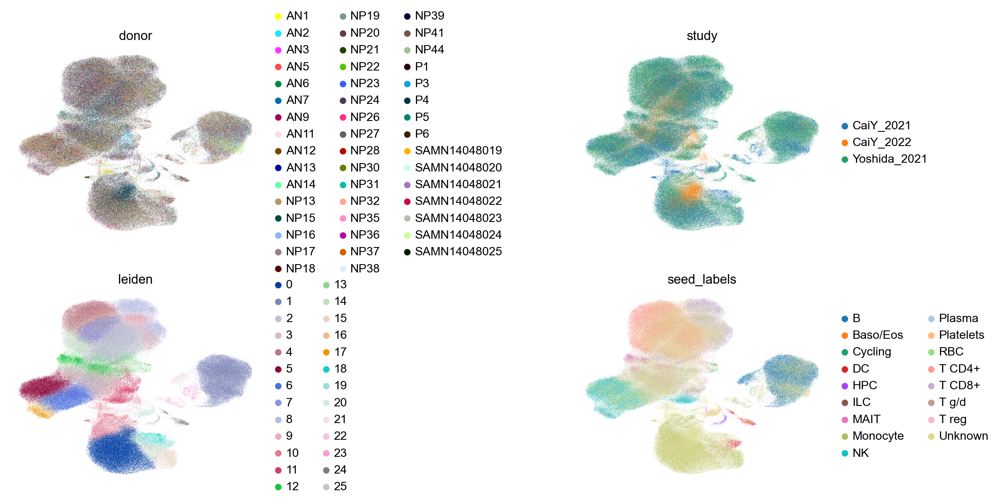

In [34]:
sc.pl.umap(
    adata,
    color=["donor", "study", "leiden", "seed_labels"],
    frameon=False,
    ncols=2,
    wspace=1
)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


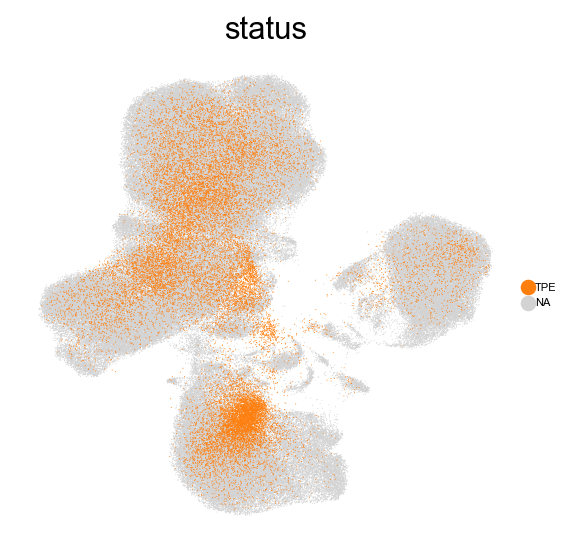

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


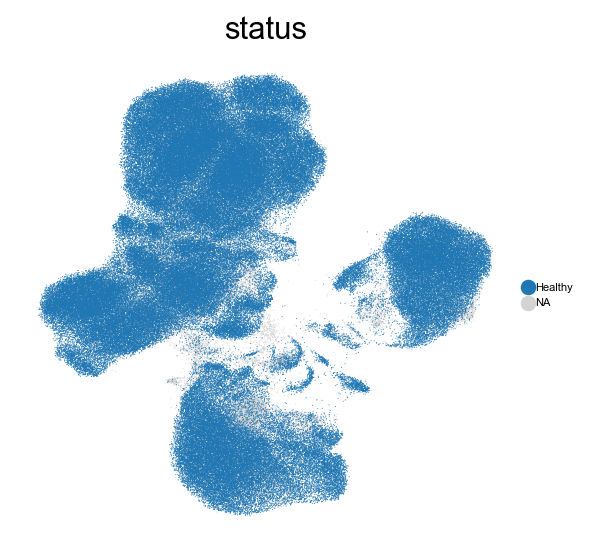

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


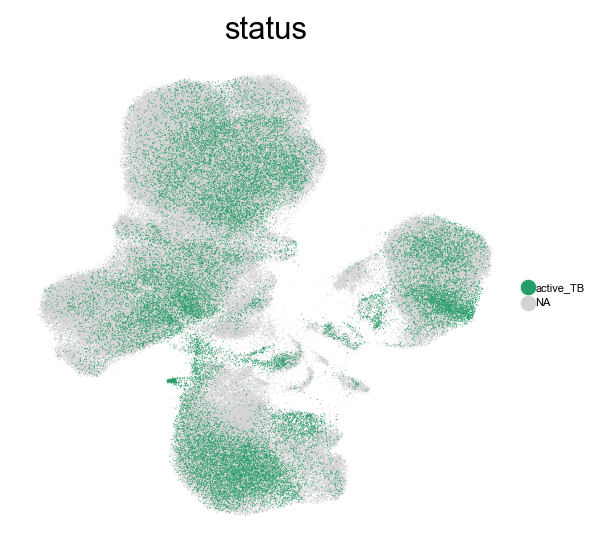

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


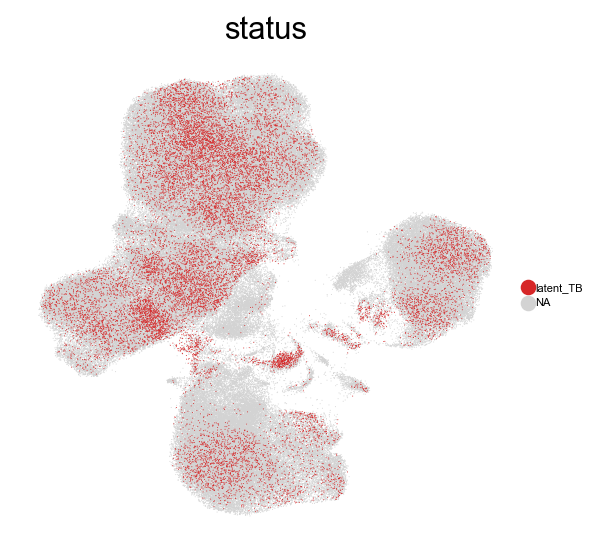

In [35]:
sc.pl.umap(adata, frameon = False, color = ['status'], groups='TPE', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='Healthy', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='active_TB', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='latent_TB', size = 0.8, legend_fontsize = 5)

### Label transfer with scANVI

In [36]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_vae, unlabeled_category = 'Unknown', labels_key = 'seed_labels')

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [37]:
scanvi_model.train(max_epochs=25)

INFO     Training for 25 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(


Epoch 25/25: 100%|██████████| 25/25 [42:50<00:00, 102.87s/it, loss=2.88e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [42:50<00:00, 102.80s/it, loss=2.88e+03, v_num=1]


In [38]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Get latent representation

In [39]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation()

- Visualise

In [ ]:
# Leiden clustering removed as will be optimized via SCCAF

sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 4, random_state = 1712)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


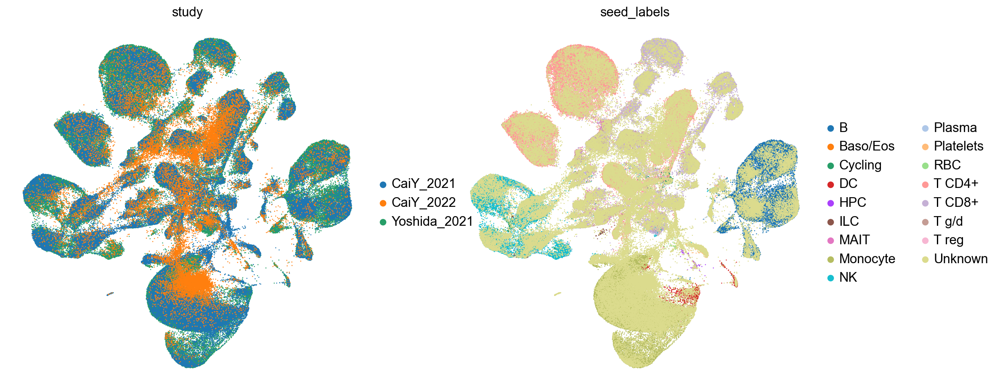

In [41]:
sc.set_figure_params(scanpy=True, figsize=(7, 7))
sc.pl.umap(adata, frameon = False, color = ['study', 'seed_labels'], size = 5, legend_fontsize = 14, ncols = 2)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


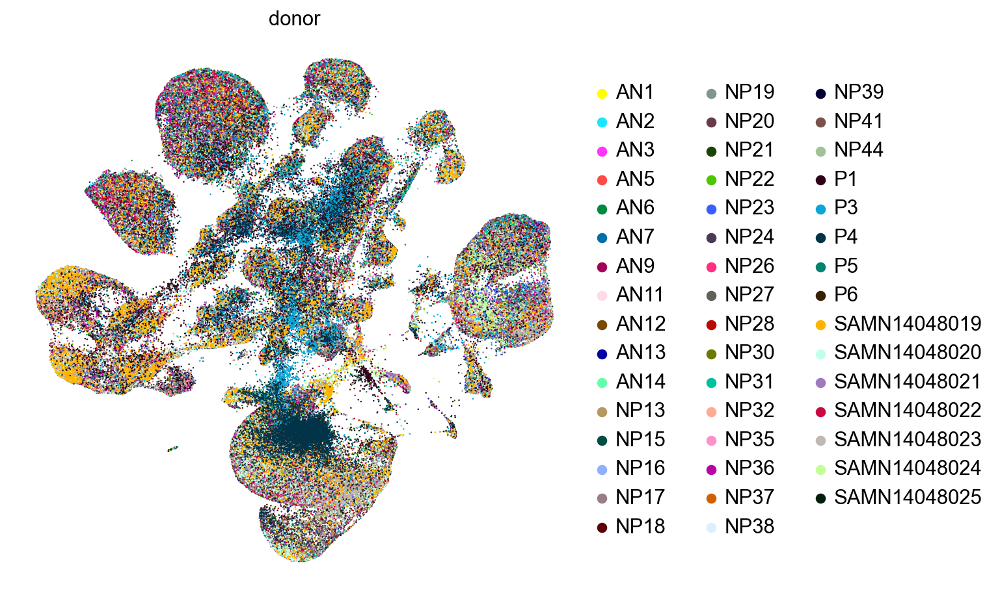

In [42]:
sc.set_figure_params(scanpy=True, figsize=(7, 7))
sc.pl.umap(adata, frameon = False, color = ['donor'], size = 5, legend_fontsize = 14, ncols = 2)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


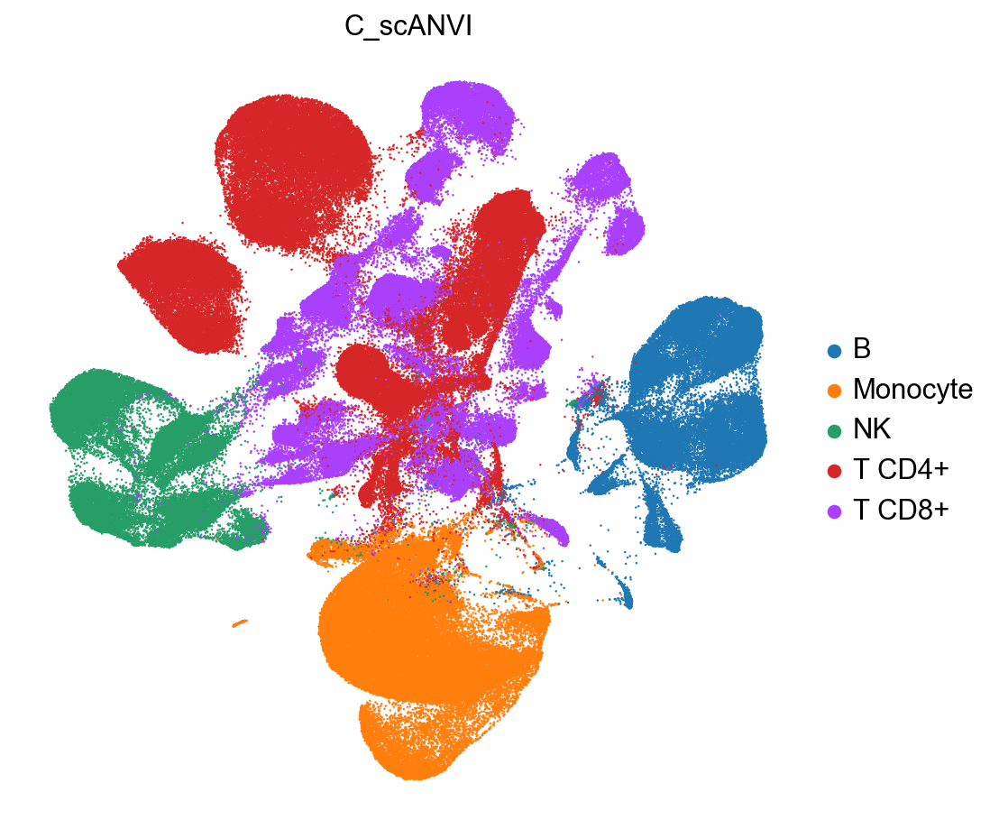

In [43]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI'], size = 5, legend_fontsize = 14, ncols = 2)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


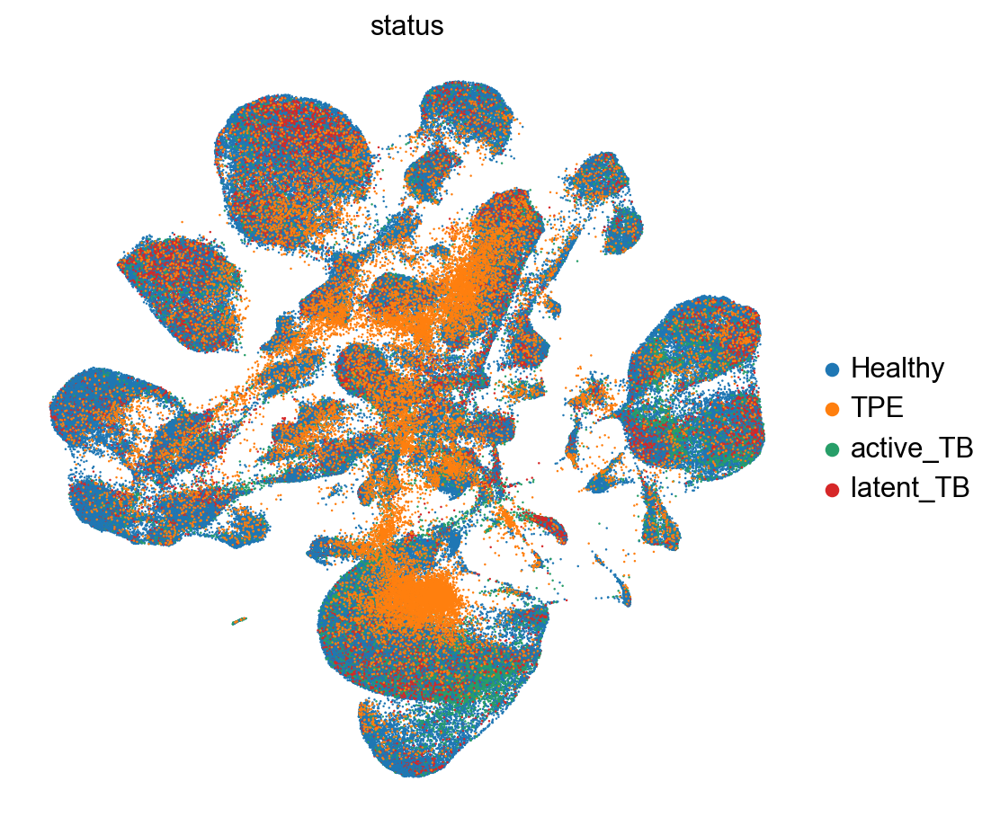

In [44]:
sc.pl.umap(adata, frameon = False, color = ['status'], size = 5, legend_fontsize = 14, ncols = 2)

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


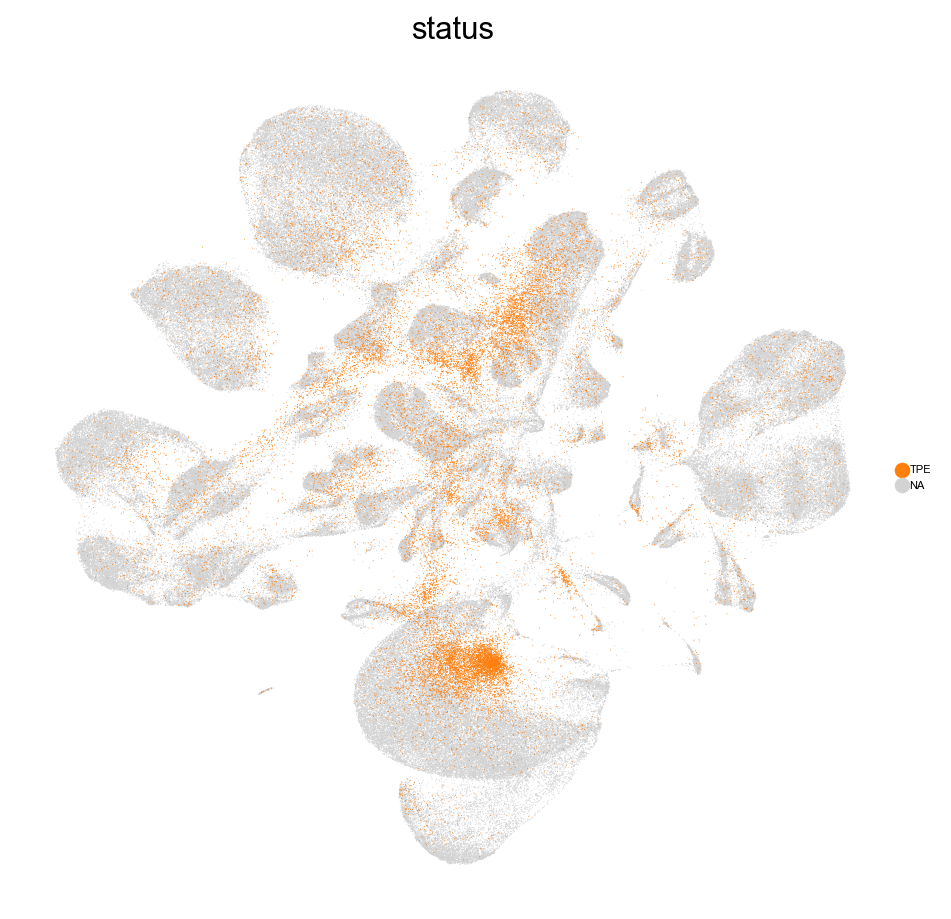

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


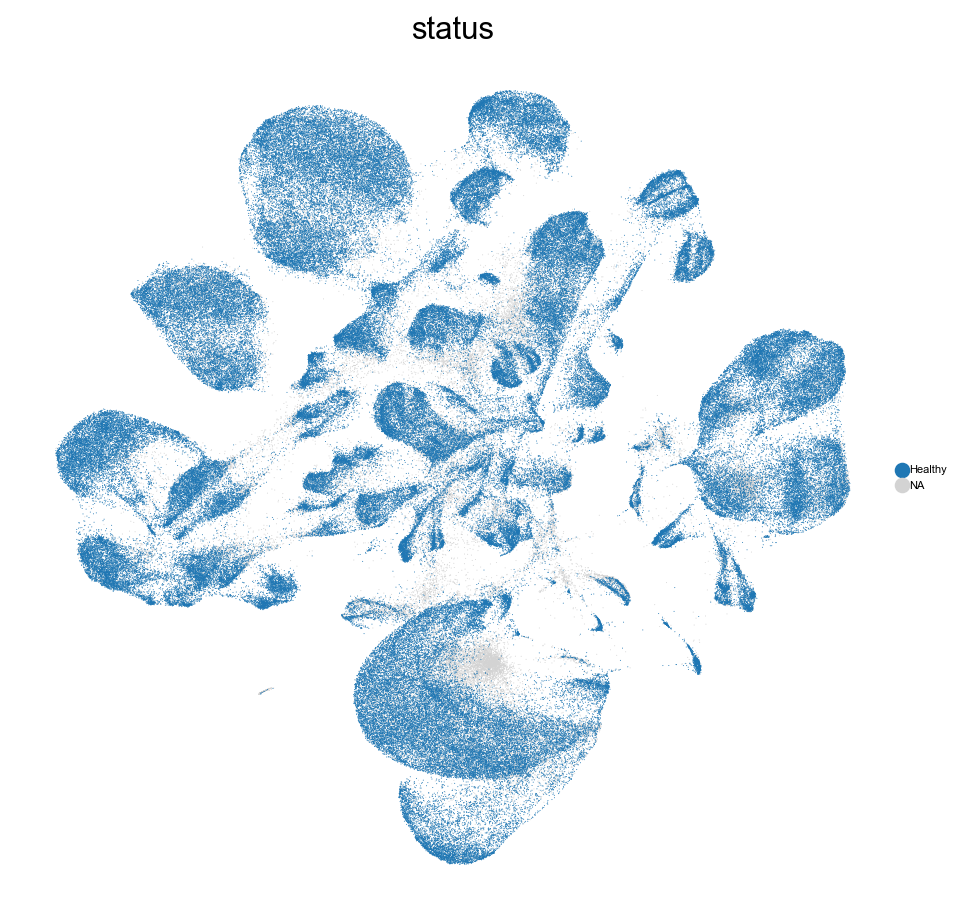

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


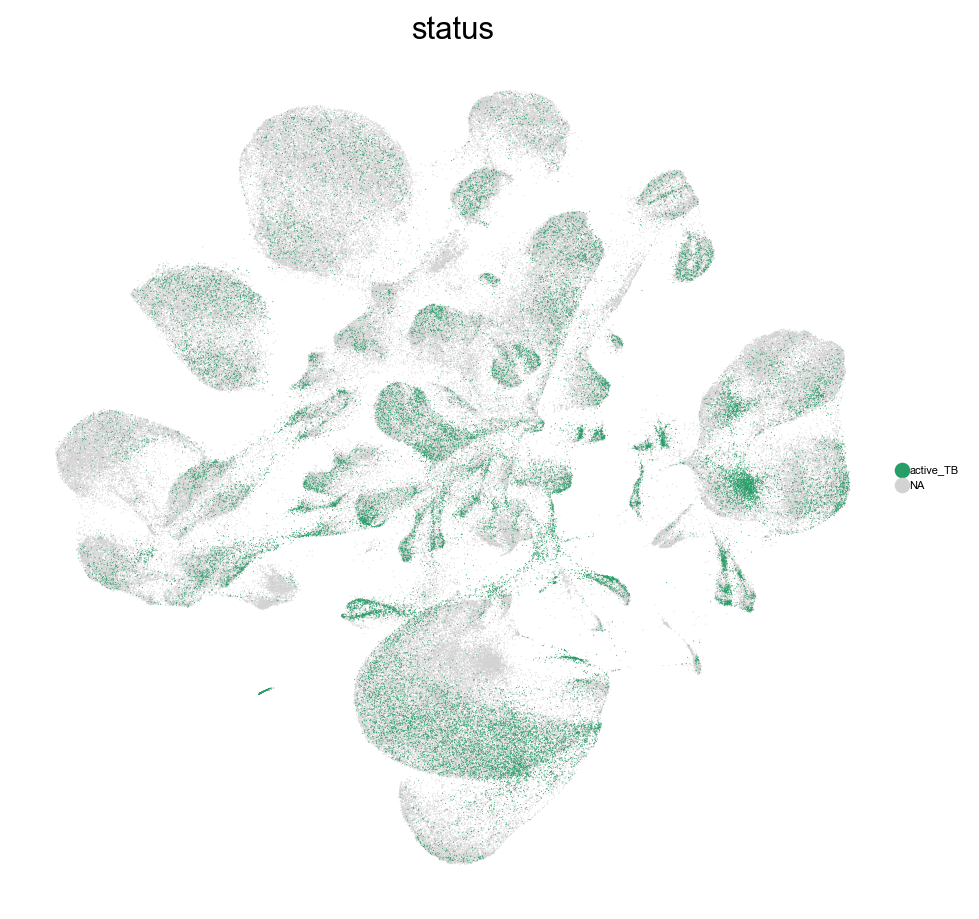

/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


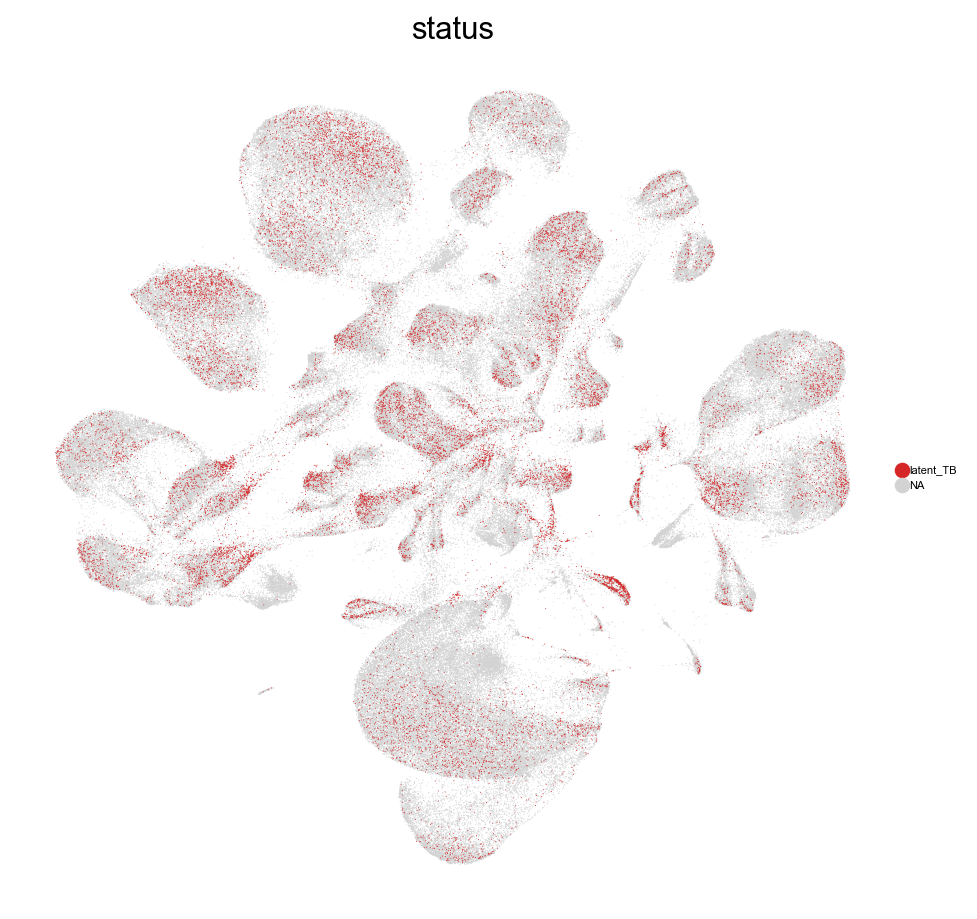

In [45]:
sc.pl.umap(adata, frameon = False, color = ['status'], groups='TPE', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='Healthy', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='active_TB', size = 0.8, legend_fontsize = 5)
sc.pl.umap(adata, frameon = False, color = ['status'], groups='latent_TB', size = 0.8, legend_fontsize = 5)

### Export annotated sample object

In [47]:
import pandas as pd 
import numpy as np
import anndata

In [48]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACATCACAAC-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCACGAT-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCTACGA-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATTTGCTT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTAAAGGAG-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTCCATCCT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTGCTGTAT-HRS100513-pbmc_scRNAseq',
  

In [49]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACATCACAAC-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCACGAT-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCTACGA-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATTTGCTT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTAAAGGAG-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTCCATCCT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTGCTGTAT-HRS100513-pbmc_scRNAseq',
  

In [50]:
adata.obs_names

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACATCACAAC-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCACGAT-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATCTACGA-HRS100513-pbmc_scRNAseq',
       'TTTGTCACATTTGCTT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTAAAGGAG-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTCCATCCT-HRS100513-pbmc_scRNAseq',
       'TTTGTCAGTGCTGTAT-HRS100513-pbmc_scRNAseq',
  

In [51]:
adata.obs['C_scANVI'].cat.categories

Index(['B', 'Monocyte', 'NK', 'T CD4+', 'T CD8+'], dtype='object')

In [52]:
adata.obs['C_scANVI'].value_counts()

C_scANVI
T CD4+      82225
T CD8+      64060
Monocyte    53067
B           38102
NK          33144
Name: count, dtype: int64

### Export annotated object with raw counts

In [53]:
adata

AnnData object with n_obs × n_vars = 270598 × 7000
    obs: 'status', 'donor', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrX', 'doublet_scores', 'seed_labels', 'tissue', 'study', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden', 'C_scANVI'
    var: 'mt', 'ribo', 'hb', 'gene_id-query', 'n_cells-cai2020-query', 'n_cells_by_counts-cai2020-query', 'mean_counts-cai2020-query', 'pct_dropout_by_counts-cai2020-query', 'total_counts-cai2020-query', 'n_cells-cai2022-query', 'n_cells_by_counts-cai2022-query', 'mean_counts-cai2022-query', 'pct_dropout_by_counts-cai2022-query', 'total_counts-cai2022-query', 'name-reference', 'n_cells-reference', 'n_cells_by_counts-reference', 'mean_counts-reference', 'pct_dropout_by_counts-reference', 'total_counts-reference', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'leiden', 'umap', 'donor_colors', 'study_colors', 'l

In [54]:
adata_raw

AnnData object with n_obs × n_vars = 270598 × 15808
    obs: 'status', 'donor', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrX', 'doublet_scores', 'seed_labels', 'tissue', 'study', 'dataset'
    var: 'mt', 'ribo', 'hb', 'gene_id-query', 'n_cells-cai2020-query', 'n_cells_by_counts-cai2020-query', 'mean_counts-cai2020-query', 'pct_dropout_by_counts-cai2020-query', 'total_counts-cai2020-query', 'n_cells-cai2022-query', 'n_cells_by_counts-cai2022-query', 'mean_counts-cai2022-query', 'pct_dropout_by_counts-cai2022-query', 'total_counts-cai2022-query', 'name-reference', 'n_cells-reference', 'n_cells_by_counts-reference', 'mean_counts-reference', 'pct_dropout_by_counts-reference', 'total_counts-reference'
    layers: 'counts', 'sqrt_norm'

In [56]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export


AnnData object with n_obs × n_vars = 270598 × 15808
    obs: 'status', 'donor', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrX', 'doublet_scores', 'seed_labels', 'tissue', 'study', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden', 'C_scANVI'
    var: 'mt', 'ribo', 'hb', 'gene_id-query', 'n_cells-cai2020-query', 'n_cells_by_counts-cai2020-query', 'mean_counts-cai2020-query', 'pct_dropout_by_counts-cai2020-query', 'total_counts-cai2020-query', 'n_cells-cai2022-query', 'n_cells_by_counts-cai2022-query', 'mean_counts-cai2022-query', 'pct_dropout_by_counts-cai2022-query', 'total_counts-cai2022-query', 'name-reference', 'n_cells-reference', 'n_cells_by_counts-reference', 'mean_counts-reference', 'pct_dropout_by_counts-reference', 'total_counts-reference'
    obsm: 'X_scVI', 'X_umap', 'X_scANVI'

In [57]:
adata_export.write('/Volumes/Expansion/data_lake/processed_files/label_transfer/230710mm_TB_PBMC_scrna_Cai20_Cai22_Yoshida21_scANVI_annot.raw.h5ad')